<a href="https://colab.research.google.com/github/nraoamuktha/Academic_projects/blob/main/Food_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this project we are developing a deep learning model to predict the type of food.

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#Installing libraries
#!pip install -q tensorflow
#!pip install -q jupyterthemes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 3.9 MB/s eta 0:00:00


In [5]:
#importing libraries

import pandas as pd
import numpy as np
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False)

In [30]:
%cd /content/drive/MyDrive/Food Classification

/content/drive/MyDrive/Food Classification


In [31]:
os.listdir('./training')

['Vegetable-Fruit',
 'Dairy product',
 'Noodles-Pasta',
 'Bread',
 'Egg',
 'Rice',
 'Dessert',
 'Fried food',
 'Meat',
 'Seafood',
 'Soup']

In [32]:
os.listdir('./validation')

['Dairy product',
 'Dessert',
 'Fried food',
 'Meat',
 'Noodles-Pasta',
 'Seafood',
 'Egg',
 'Rice',
 'Bread',
 'Soup',
 'Vegetable-Fruit']

In [35]:
# Check the number of images in training, validation and evaluation dataset
train = []
valid = []
test = []

# os.listdir returns the list of files in the folder, in this case image class
# names
for i in os.listdir('./training'):
    train.extend(os.listdir(os.path.join('training', i)))
    valid.extend(os.listdir(os.path.join('validation', i)))
    test.extend(os.listdir(os.path.join('evaluation', i)))

print('Number of train images: {} \nNumber of validation images: {} \nNumber of test images: {}'.format(len(train),len(valid),len(test)))


Number of train images: 8588 
Number of validation images: 3437 
Number of test images: 3347


In [36]:
train

['662.jpg',
 '659.jpg',
 '578.jpg',
 '190.jpg',
 '445.jpg',
 '454.jpg',
 '442.jpg',
 '30.jpg',
 '256.jpg',
 '493.jpg',
 '447.jpg',
 '686.jpg',
 '304.jpg',
 '298.jpg',
 '175.jpg',
 '160.jpg',
 '185.jpg',
 '142.jpg',
 '140.jpg',
 '12.jpg',
 '143.jpg',
 '144.jpg',
 '112.jpg',
 '113.jpg',
 '11.jpg',
 '114.jpg',
 '111.jpg',
 '110.jpg',
 '106.jpg',
 '120.jpg',
 '127.jpg',
 '124.jpg',
 '123.jpg',
 '121.jpg',
 '125.jpg',
 '115.jpg',
 '103.jpg',
 '100.jpg',
 '101.jpg',
 '1.jpg',
 '128.jpg',
 '119.jpg',
 '130.jpg',
 '116.jpg',
 '131.jpg',
 '129.jpg',
 '105.jpg',
 '141.jpg',
 '117.jpg',
 '104.jpg',
 '10.jpg',
 '102.jpg',
 '0.jpg',
 '132.jpg',
 '135.jpg',
 '126.jpg',
 '122.jpg',
 '13.jpg',
 '108.jpg',
 '118.jpg',
 '109.jpg',
 '107.jpg',
 '226.jpg',
 '224.jpg',
 '22.jpg',
 '218.jpg',
 '178.jpg',
 '150.jpg',
 '149.jpg',
 '225.jpg',
 '217.jpg',
 '211.jpg',
 '164.jpg',
 '162.jpg',
 '166.jpg',
 '146.jpg',
 '134.jpg',
 '133.jpg',
 '137.jpg',
 '139.jpg',
 '138.jpg',
 '136.jpg',
 '216.jpg',
 '198.jpg',
 '

**Exploratory Data Analysis**

In [37]:
train_class = os.listdir(os.path.join('training','Seafood'))
train_class

['115.jpg',
 '139.jpg',
 '141.jpg',
 '0.jpg',
 '13.jpg',
 '134.jpg',
 '128.jpg',
 '135.jpg',
 '121.jpg',
 '113.jpg',
 '104.jpg',
 '106.jpg',
 '118.jpg',
 '117.jpg',
 '119.jpg',
 '10.jpg',
 '122.jpg',
 '111.jpg',
 '124.jpg',
 '15.jpg',
 '140.jpg',
 '11.jpg',
 '136.jpg',
 '108.jpg',
 '123.jpg',
 '129.jpg',
 '1.jpg',
 '125.jpg',
 '109.jpg',
 '127.jpg',
 '14.jpg',
 '133.jpg',
 '132.jpg',
 '131.jpg',
 '130.jpg',
 '138.jpg',
 '137.jpg',
 '126.jpg',
 '114.jpg',
 '120.jpg',
 '116.jpg',
 '12.jpg',
 '112.jpg',
 '105.jpg',
 '110.jpg',
 '107.jpg',
 '103.jpg',
 '101.jpg',
 '100.jpg',
 '102.jpg',
 '169.jpg',
 '226.jpg',
 '225.jpg',
 '224.jpg',
 '223.jpg',
 '227.jpg',
 '222.jpg',
 '220.jpg',
 '180.jpg',
 '159.jpg',
 '160.jpg',
 '204.jpg',
 '231.jpg',
 '153.jpg',
 '23.jpg',
 '175.jpg',
 '176.jpg',
 '174.jpg',
 '172.jpg',
 '171.jpg',
 '216.jpg',
 '207.jpg',
 '230.jpg',
 '191.jpg',
 '218.jpg',
 '142.jpg',
 '149.jpg',
 '148.jpg',
 '146.jpg',
 '145.jpg',
 '144.jpg',
 '147.jpg',
 '206.jpg',
 '22.jpg',
 '19

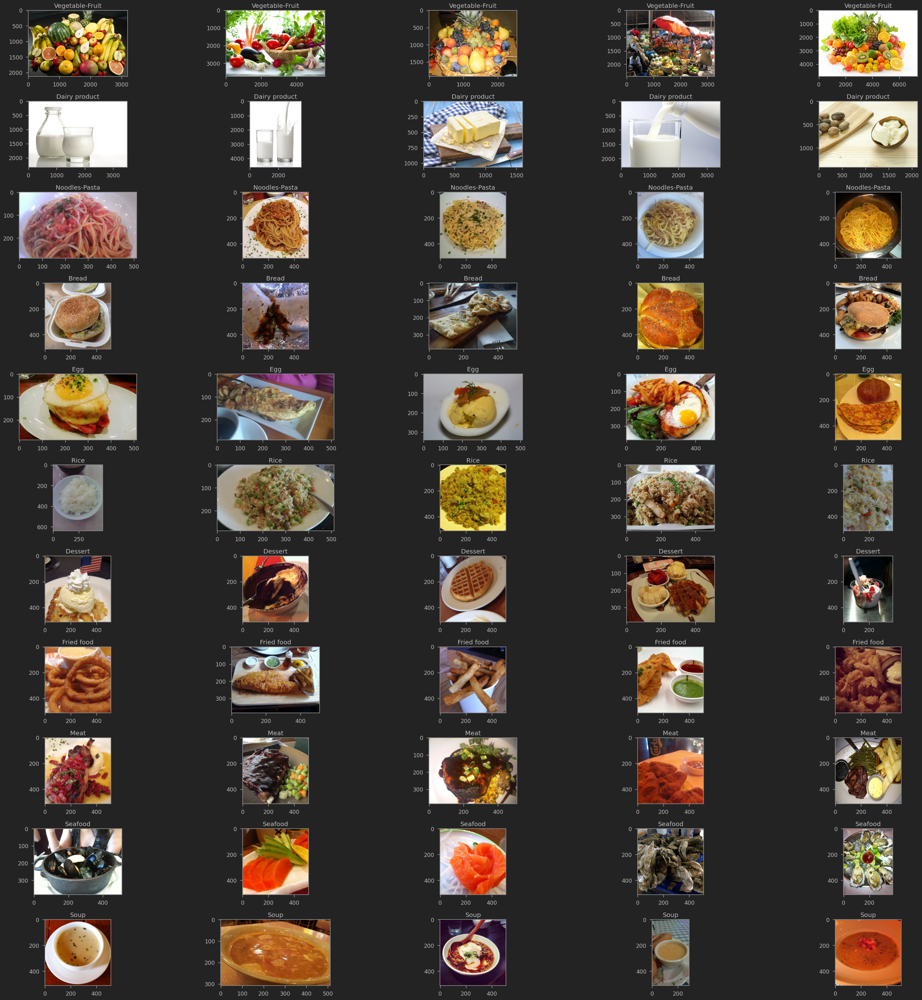

In [38]:
# Visualize the images in the dataset

fig, axs = plt.subplots(11, 5, figsize = (32,32))
count = 0
# for every class in the dataset
for i in os.listdir('./training'):
  # get the list of all images that belong to a particular class
  train_class = os.listdir(os.path.join('training', i))

   # plot 5 images per class
  for j in range(5):
    img = os.path.join('training', i, train_class[j])
    axs[count][j].title.set_text(i)
    axs[count][j].imshow(PIL.Image.open(img))
  count += 1

fig.tight_layout()


In [39]:
# check the number of images in each class in the training dataset

No_images_per_class = []
Class_name = []
for i in os.listdir('./training'):
  Class_name.append(i)
  train_class = os.listdir(os.path.join('training',i))
  print('Number of images in {}={}\n'.format(i,len(train_class)))
  No_images_per_class.append(len(train_class))

Number of images in Vegetable-Fruit=709

Number of images in Dairy product=429

Number of images in Noodles-Pasta=440

Number of images in Bread=994

Number of images in Egg=986

Number of images in Rice=280

Number of images in Dessert=1500

Number of images in Fried food=848

Number of images in Meat=1325

Number of images in Seafood=855

Number of images in Soup=1500



In [40]:
No_images_per_class

[709, 429, 440, 994, 986, 280, 1500, 848, 1325, 855, 1500]

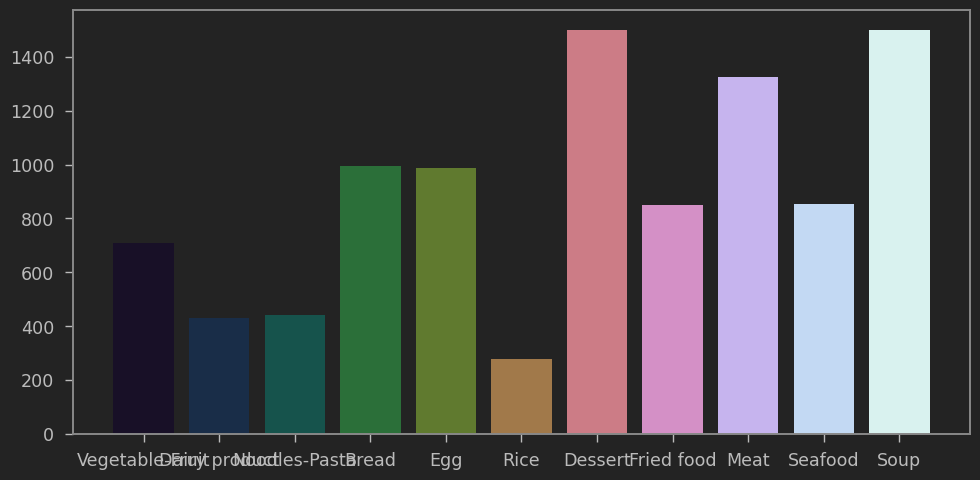

In [41]:
# visualize the number of images in each class in the training dataset

fig = plt.figure(figsize=(10,5))
plt.bar(Class_name, No_images_per_class, color = sns.color_palette("cubehelix",len(Class_name)))
fig.tight_layout()

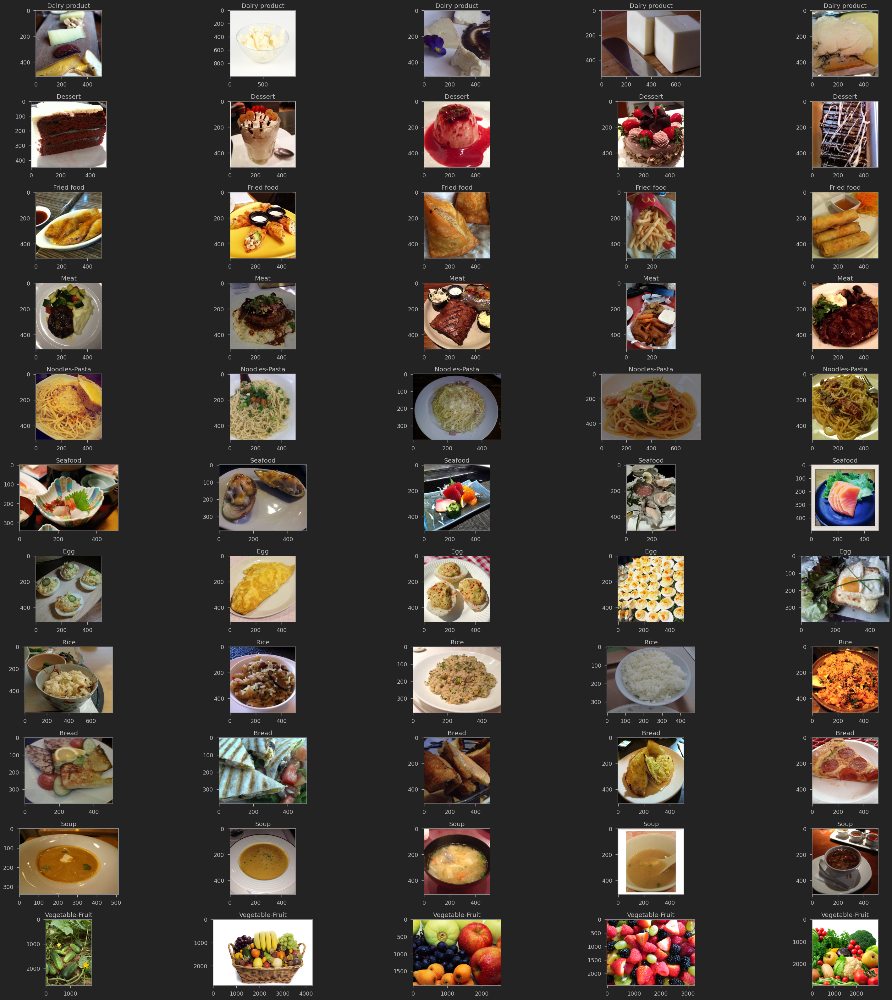

In [42]:
# Visualize the images in the dataset for Validation Dataset

fig, axs = plt.subplots(11, 5, figsize = (32,32))
count = 0
# for every class in the dataset
for i in os.listdir('./validation'):
  # get the list of all images that belong to a particular class
  valid_class = os.listdir(os.path.join('validation', i))

   # plot 5 images per class
  for j in range(5):
    img = os.path.join('validation', i, valid_class[j])
    axs[count][j].title.set_text(i)
    axs[count][j].imshow(PIL.Image.open(img))
  count += 1

fig.tight_layout()


In [44]:
# check the number of images in each class in the training dataset

No_images_per_class = []
Class_name = []
for i in os.listdir('./validation'):
  Class_name.append(i)
  train_class = os.listdir(os.path.join('validation',i))
  print('Number of images in {}={}\n'.format(i,len(train_class)))
  No_images_per_class.append(len(train_class))

Number of images in Dairy product=144

Number of images in Dessert=500

Number of images in Fried food=326

Number of images in Meat=449

Number of images in Noodles-Pasta=147

Number of images in Seafood=347

Number of images in Egg=327

Number of images in Rice=96

Number of images in Bread=362

Number of images in Soup=500

Number of images in Vegetable-Fruit=239



In [45]:
No_images_per_class

[144, 500, 326, 449, 147, 347, 327, 96, 362, 500, 239]

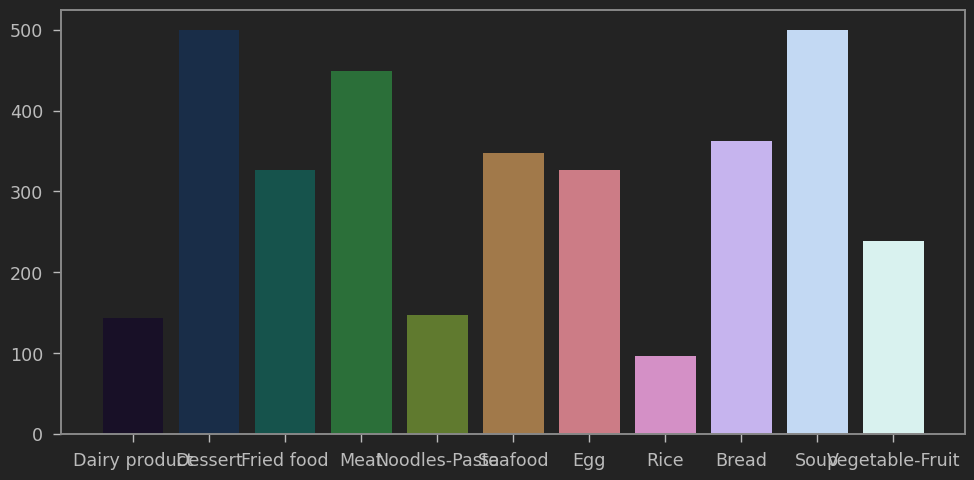

In [46]:

fig = plt.figure(figsize=(10,5))
plt.bar(Class_name, No_images_per_class, color = sns.color_palette("cubehelix",len(Class_name)))
fig.tight_layout()

**PERFORM IMAGE AUGMENTATION AND CREATE DATA GENERATOR**

In [47]:
# create run-time augmentation on training and test dataset
# For training datagenerator,  we add normalization, shear angle, zooming range and horizontal flip
train_datagen = ImageDataGenerator(rescale = 1./255,
                zoom_range=0.2,
                horizontal_flip = True)

# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale=1./255)

MINI CHALLENGE #2:

Experiment with other image augmentation strategies to the training data. Pick at least 1 augmentation strategy.
HINT: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator



In [49]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                zoom_range=0.2,
                horizontal_flip = True,
                brightness_range=(0,10))

# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale=1./255)

In [50]:
# Create data generator for training, validation and test dataset.
train_generator = train_datagen.flow_from_directory(
        'training',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')


Found 9866 images belonging to 11 classes.



**MINI CHALLENGE #3:**

Create data generator for the validation and testing datasets

In [51]:
# Create data generator for training, validation and test dataset.
valid_generator = test_datagen.flow_from_directory(
        'validation',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')


Found 3437 images belonging to 11 classes.


In [53]:
# Create data generator for training, validation and test dataset.
test_generator = test_datagen.flow_from_directory(
        'evaluation',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')


Found 3347 images belonging to 11 classes.


UNDERSTAND THE THEORY AND INTUITION BEHIND TRANSFER LEARNING

In [55]:
basemodel = InceptionResNetV2(weights="imagenet", include_top = False, input_tensor = Input(shape = (256, 256, 3)))

219055592/219055592 [==============================] - 2s 0us/step


In [56]:
basemodel.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 127, 127, 32)         0         ['batch_norm

In [58]:
# Freeze the basemodel weights , so these weights won't change during training
basemodel.trainable = False

In [59]:
# Add classification head to the model
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D(name = 'global_average_pool')(headmodel)
headmodel = Flatten(name = 'flatten')(headmodel)
headmodel = Dense(256, activation= 'relu', name = 'dense_1')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(128, activation= 'relu', name = 'dense_2')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(11, activation= 'relu', name = 'dense_3')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [60]:
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256,256,3)))

94765736/94765736 [==============================] - 1s 0us/step


 COMPILE AND TRAIN DEEP LEARNING MODEL


In [62]:
# compile the model
model.compile(loss='categorical_crossentropy', optimizer = SGD(learning_rate = 0.01, momentum = 0.9), metrics = ['accuracy'])

In [63]:
# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="weights.hdf5", verbose=1, save_best_only=True)

In [65]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 32, epochs = 1, validation_data= valid_generator, validation_steps= valid_generator.n // 32, callbacks=[checkpointer, earlystopping])

 96/308 [========>.....................] - ETA: 48:18 - loss: 3.6609 - accuracy: 0.1598

KeyboardInterrupt: 

FINE TUNE THE TRAINED MODEL

In [66]:
basemodel.trainable = True

In [67]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 127, 127, 32)         0         ['batch_normalization[0]

In [68]:
# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="weights_fine.hdf5", verbose=1, save_best_only=True)

In [72]:
model.compile(loss = 'categorical_crossentropy', optimizer=SGD(learning_rate=0.0001, momentum=0.9))
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 32, epochs = 10, validation_data= valid_generator, validation_steps= valid_generator.n // 32, callbacks=[checkpointer, earlystopping])

Epoch 1/10
308/308 [==============================] - ETA: 0s - loss: 3.3572 

KeyboardInterrupt: 

ASSESS THE PERFORMANCE OF THE TRAINED MODEL

In [73]:
# Load a pretrained weightte_generator(test_generator, steps=test_generator.n //)

model.load_weights('weights_fine.hdf5')